## EE 242 Lab 4b – Digital Filtering - Applying Filters to Sound

Author names go here 

This lab has 2 exercises to be completed as a team. Each should be given a separate code cell in your Notebook, followed by a markdown cell with report discussion. Your notebook should start with a markdown title and overview cell, which should be followed by an import cell that has the import statements for all assignments. For this assignment, you will need to import: numpy, the wavfile package from scipy.io, simpleaudio/librosa, and matplotlib.pyplot.  

In [78]:
# We'll refer to this as the "import cell." Every module you import should be imported here.
%matplotlib notebook
import numpy as np
import matplotlib
import scipy.signal as sig
import matplotlib.pyplot as plt
import scipy.io.wavfile as sp
import scipy
import IPython
# import whatever other modules you use in this lab -- there are more that you need than we've included 

## Summary

In this lab, we will consider different types of digital filters (specifically discrete-time, linear, time-invariant filters) and look at their characterization in both time and frequency. This will give you some insight into how digital filters are implemented and into the properties of different digital filter design algorithms. You’ll also learn about some of the signal processing functions available from the signal module in the scipy package which will be useful for designing and implement filters.  You will work with examples that show you how filtering can be useful to remove noise and reshape the frequency content of a signal. Specifically, we’ll revisit the lab 2 problem of removing noise from signals (or smoothing signals), then explore filter design methods, and finally implement a simple audio equalizer. This is a 2-week lab. It is recommended to work on the first 2 assignments in the first week and the remaining 
assignments in the second week. 

## Lab 4b turn in checklist

•	Lab 4b Jupyter notebook with code for the 2 exercises assignment in separate cells. Each assignment cell should contain markdown cells (same as lab overview cells) for the responses to lab report questions. Include your lab members’ names at the top of the notebook.

**Please submit the report as PDF** (You may also use : https://www.vertopal.com/  suggested by a student)




## Assignment 3 -- Filtering an Audio Signal

In this assignment, we’ll explore different filtering problems using the horn signal that you worked with in Labs 2 and 3. You will need the audio packages that you used in previous labs. This assignment will have three parts, A-C.

**A.** Read in the horn sound horn11short.wav. Design a highpass filter with a cutoff of 550Hz to remove the first harmonic. A Butterworth filter of order 8 should work. Plot the magnitude response and the impulse response of your filter.  Using the same section of the signal as in lab 3, compute the FFT of the original and the filtered signal, and plot the log magnitude frequency content in a 2x1 plot. Play the original and the filtered waveforms. 

**B.** Create a noisy version of the horn sound by generating a sequence of random noise, as in lab 2, but with a scaling factor of 1000, and then adding that to the horn signal. Plot the log magnitude of the frequency content for the two signals, as in part A. Play the resulting signal and confirm that the noise is audible.  

**C.** Design a lowpass filter with a cut-off corresponding to 1800Hz to remove the high frequency noise.  (You can use a lower cut-off to remove more noise, but then you start removing audible harmonics.) Plot the log magnitude response and the impulse response of the filter. Plot the frequency content of the filtered signal.

In [79]:
# Functions

def butter_highpass(cutoff, order):

    b, a = sig.butter(order, cutoff, 'highpass')
    
    return b, a

def butter_lowpass(cutoff, order):
    
    b, a = sig.butter(order, cutoff, 'lowpass')
    
    return b, a

def impulse_response(b, a, implength):
    
    x = np.concatenate((np.ones(1), np.zeros(implength - 1)))
    
    axis = np.arange(implength)
    ht = sig.lfilter(b,a,x)
    
    fig, ax = plt.subplots(1, 1)
    ax.stem(axis, ht)
    ax.set_title('Impulse Response')
    return ax, ht

def plot_mag_freq_response(b, a, plot_phase = 0, fs = 0):
    # plot_phase and fs are 0 by default, feel free to change the default values
    # If plot_phase is 0, do not plot the phase response, else plot the phase response
    # If fs is 0, the x axis would be in radians, otherwise it would be in Hz based on the sampling frequency provided
    # Use signal.freqz to get your frequency response 
    
    w, hf = sig.freqz(b, a)
    
    unit = '(Rad)'
    if fs != 0:
        f = w * fs/(2*np.pi)
        unit = '(Hz)'
    else:
        f = w
    
    if (fs != 0):
        fig, (ax1, ax2) = plt.subplots(1, 2)
        ax1.set_title('Magnitude of Frequency Response')
        ax1.plot(w, 20 * np.log10(np.abs(hf)))
        ax1.set_ylim([-100,0])
        ax1.set_ylabel('Magnitude (dB)')
        ax1.set_xlabel('Frequency ' + unit)
        
        ax2.set_title('Phase of Frequency Response')
        ax2.plot(f, np.rad2deg(np.unwrap(np.angle(hf))))
        ax2.set_ylabel('Phase (Rad)')
        ax2.set_xlabel('Frequency ' + unit)
        return ax1, ax2, w, hf
    else:
        fig, (ax1, ax2) = plt.subplots(1, 1)
        ax1.set_title('Magnitude of Frequency Response')
        ax1.plot(w, 20 * np.log10(np.abs(hf)))
        ax1.set_ylim([-100,0])
        ax1.set_ylabel('Magnitude (dB)')
        ax1.set_xlabel('Frequency ' + unit)
        return ax1, ax2, w, hf



Cutoff: 0.09977324263038549


<IPython.core.display.Javascript object>


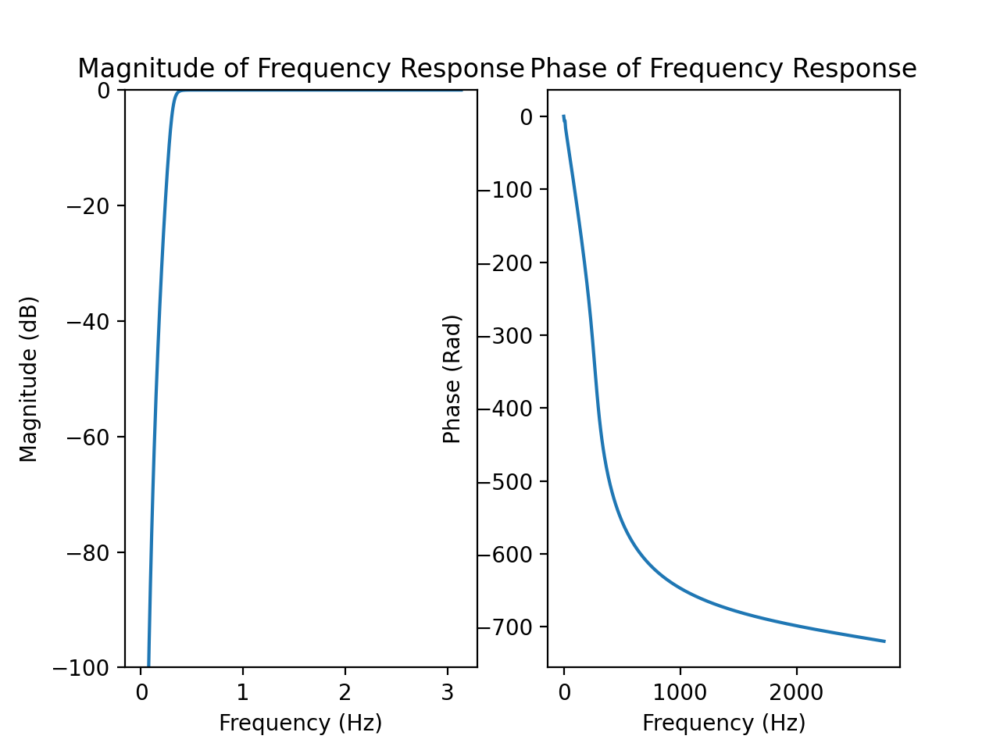

<IPython.core.display.Javascript object>


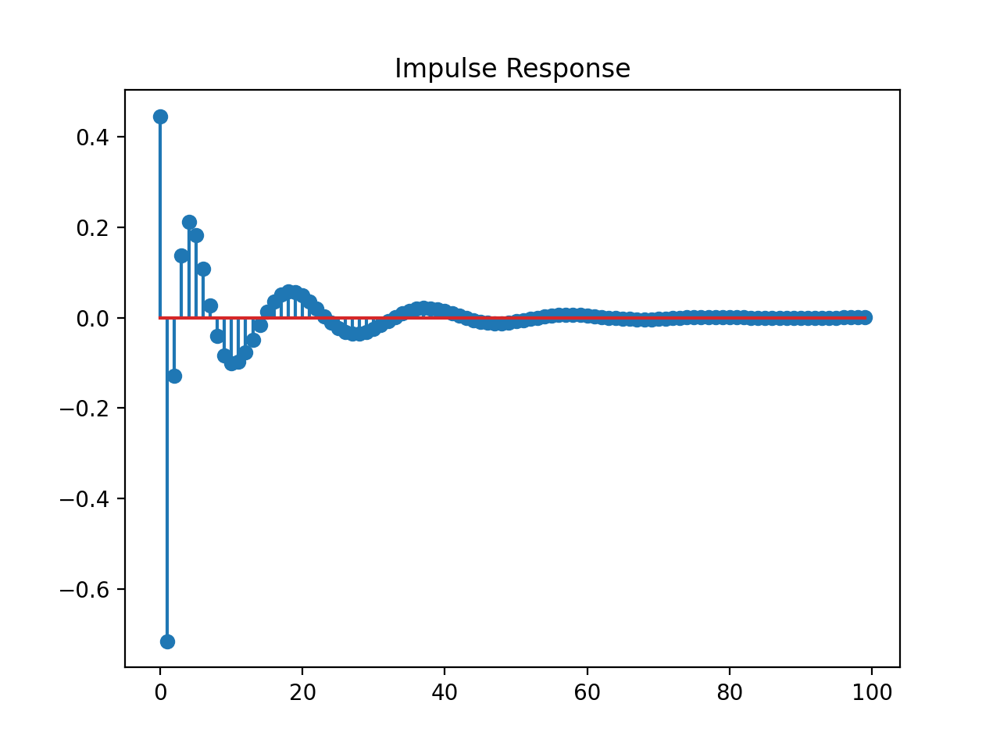

<IPython.core.display.Javascript object>


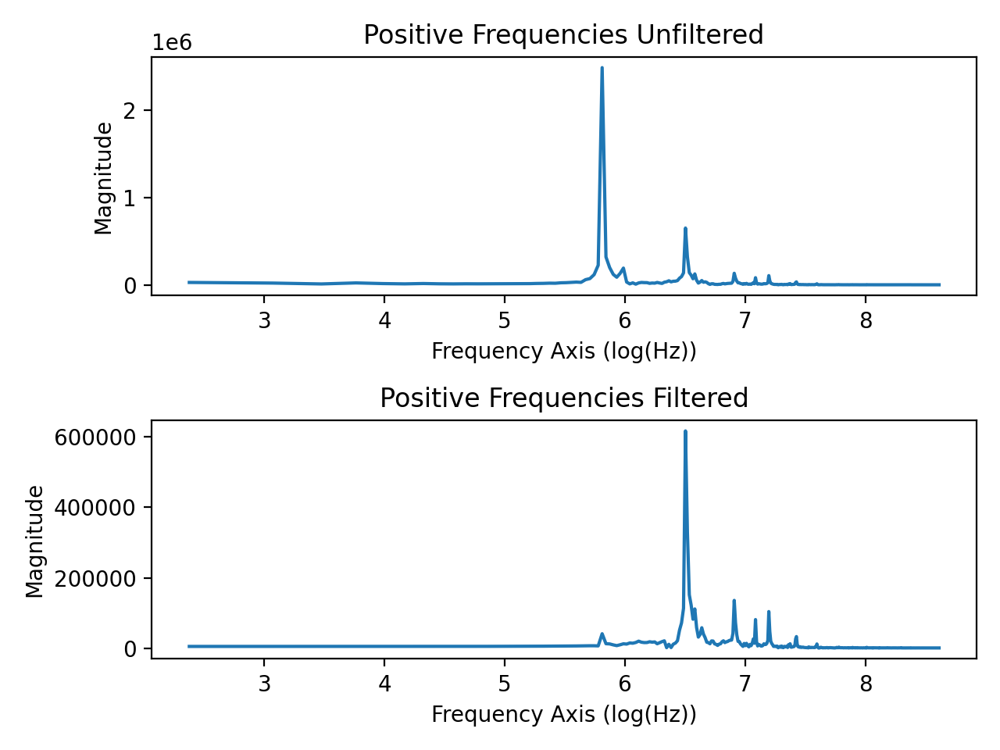

/var/folders/m3/0b8q92sn4bsgcqxnx_rn52900000gn/T/ipykernel_78693/2638385385.py:40: RuntimeWarning: divide by zero encountered in log
  ax0.plot(np.log(h_plot), np.abs(xh2))
/var/folders/m3/0b8q92sn4bsgcqxnx_rn52900000gn/T/ipykernel_78693/2638385385.py:40: RuntimeWarning: invalid value encountered in log
  ax0.plot(np.log(h_plot), np.abs(xh2))
/var/folders/m3/0b8q92sn4bsgcqxnx_rn52900000gn/T/ipykernel_78693/2638385385.py:45: RuntimeWarning: divide by zero encountered in log
  ax1.plot(np.log(h_plot), np.abs(xhf2))
/var/folders/m3/0b8q92sn4bsgcqxnx_rn52900000gn/T/ipykernel_78693/2638385385.py:45: RuntimeWarning: invalid value encountered in log
  ax1.plot(np.log(h_plot), np.abs(xhf2))


<IPython.core.display.Javascript object>


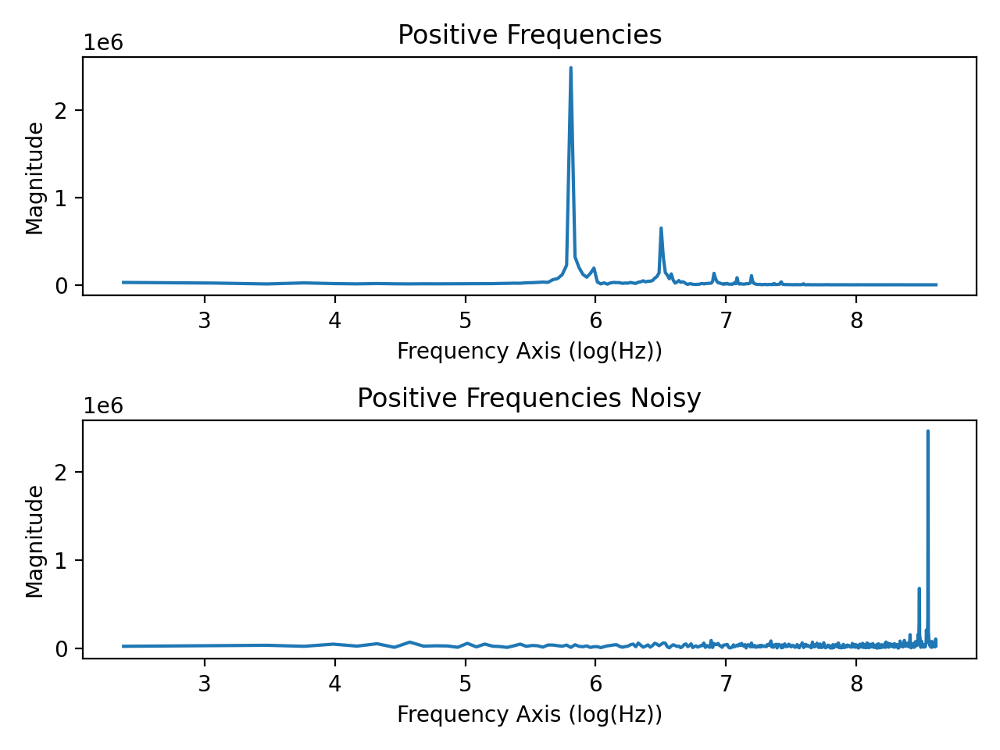

/var/folders/m3/0b8q92sn4bsgcqxnx_rn52900000gn/T/ipykernel_78693/2638385385.py:78: RuntimeWarning: divide by zero encountered in log
  ax0.plot(np.log(h_plot), np.abs(xh2))
/var/folders/m3/0b8q92sn4bsgcqxnx_rn52900000gn/T/ipykernel_78693/2638385385.py:78: RuntimeWarning: invalid value encountered in log
  ax0.plot(np.log(h_plot), np.abs(xh2))
/var/folders/m3/0b8q92sn4bsgcqxnx_rn52900000gn/T/ipykernel_78693/2638385385.py:83: RuntimeWarning: divide by zero encountered in log
  ax1.plot(np.log(h_plot), np.abs(xn))
/var/folders/m3/0b8q92sn4bsgcqxnx_rn52900000gn/T/ipykernel_78693/2638385385.py:83: RuntimeWarning: invalid value encountered in log
  ax1.plot(np.log(h_plot), np.abs(xn))


Cutoff: 0.09977324263038549


<IPython.core.display.Javascript object>


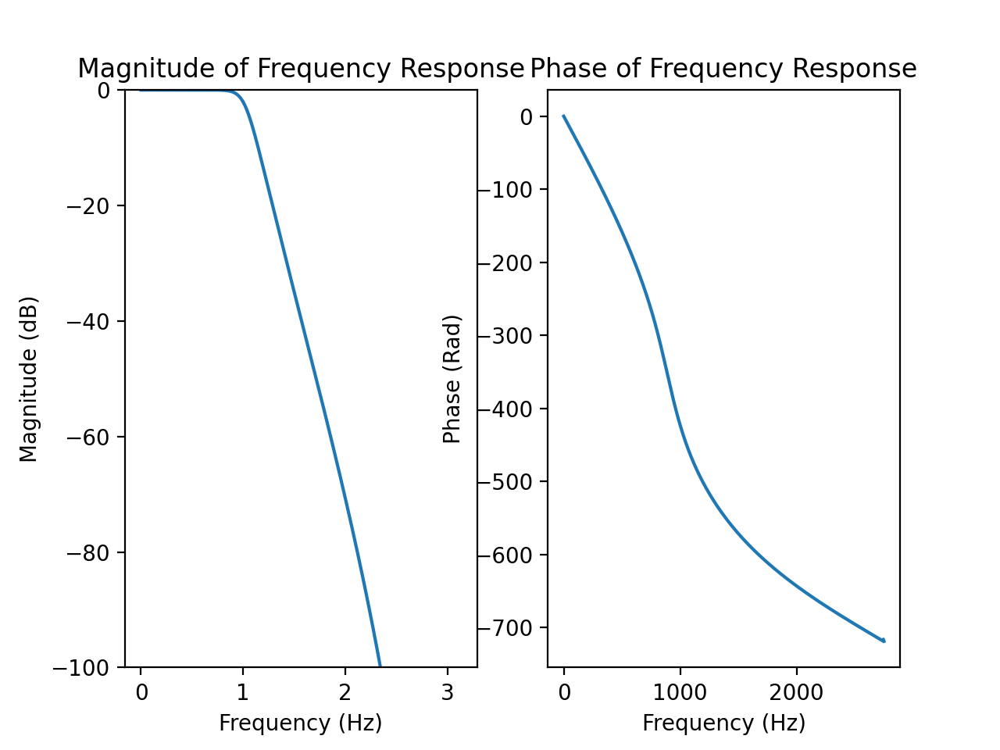

<IPython.core.display.Javascript object>


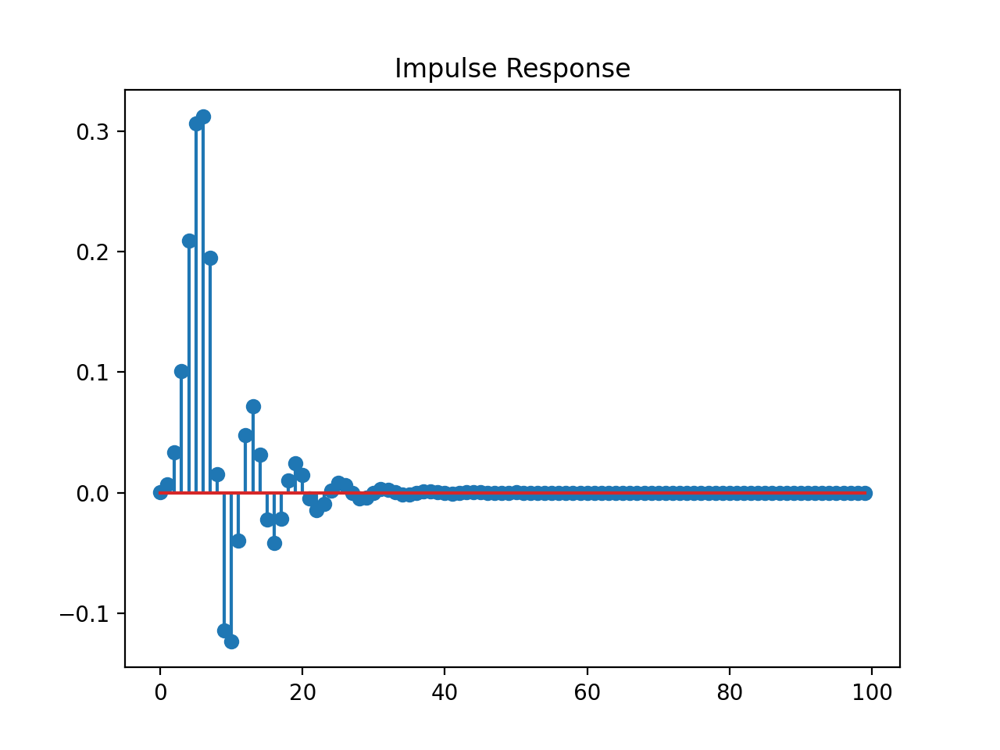

<IPython.core.display.Javascript object>


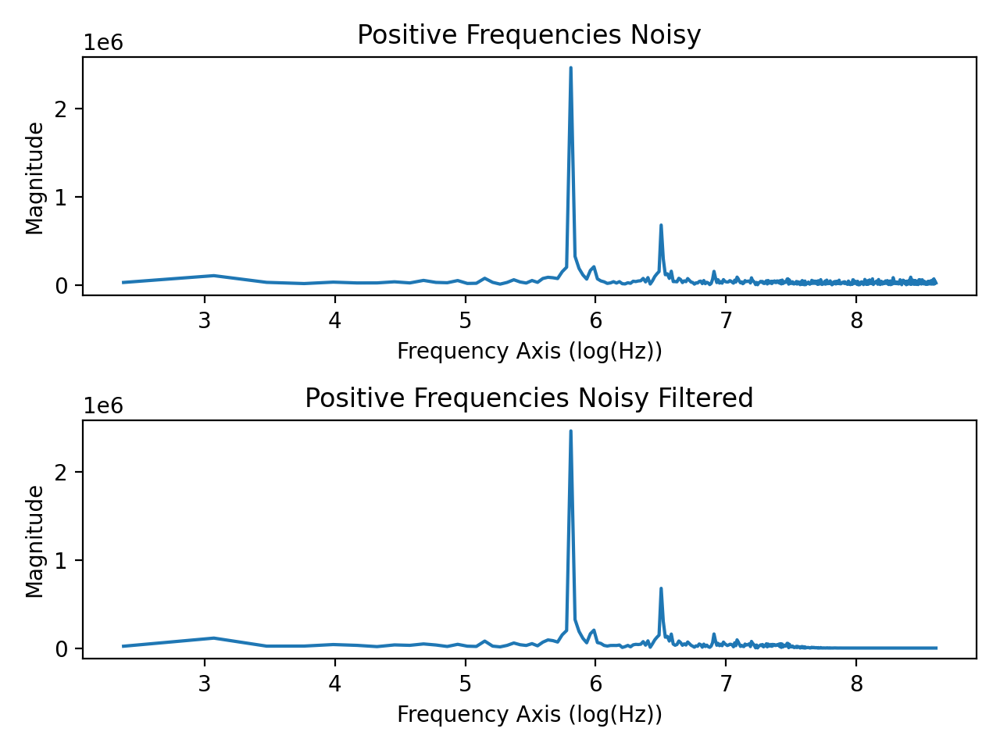

/var/folders/m3/0b8q92sn4bsgcqxnx_rn52900000gn/T/ipykernel_78693/2638385385.py:120: RuntimeWarning: divide by zero encountered in log
  ax0.plot(np.log(h_plot), np.abs(xn2))
/var/folders/m3/0b8q92sn4bsgcqxnx_rn52900000gn/T/ipykernel_78693/2638385385.py:120: RuntimeWarning: invalid value encountered in log
  ax0.plot(np.log(h_plot), np.abs(xn2))
/var/folders/m3/0b8q92sn4bsgcqxnx_rn52900000gn/T/ipykernel_78693/2638385385.py:125: RuntimeWarning: divide by zero encountered in log
  ax1.plot(np.log(h_plot), np.abs(xnf2))
/var/folders/m3/0b8q92sn4bsgcqxnx_rn52900000gn/T/ipykernel_78693/2638385385.py:125: RuntimeWarning: invalid value encountered in log
  ax1.plot(np.log(h_plot), np.abs(xnf2))


In [94]:
# Assignment 3 - Filtering an Audio Signal

# Part A
# Reading in horn signal
horn_sr, horn_orig = sp.read("horn11short.wav")

# High Pass Filter with cutoff of 550 Hz

order1 = 8
sr = 11025
nyquist = 11025 / 2
cutoff1 = 550 / (nyquist)
print('Cutoff: ' + str(cutoff1))

b1, a1 = butter_highpass(cutoff1, order1)

bw_mag_plot, bw_freq_plot, bw_mag, bw_freq = plot_mag_freq_response(b1, a1, plot_phase = 1, fs = nyquist)

butterworth_impulse_plot, butterworth_impulse = impulse_response(b1, a1, 100)

plt.show(bw_mag_plot)

horn_filt = np.convolve(butterworth_impulse, horn_orig)


# Recall the use of numpy.fft.fft from the previous lab
xhf = np.fft.fft(horn_filt, 1024)
xh = np.fft.fft(horn_orig, 1024)

xhf2 = np.fft.fftshift(xhf)
xh2 = np.fft.fftshift(xh)

# Setting up subsection of horn for plotting
h_plot = np.arange(-len(xhf2) / 2, len(xhf2) / 2, 1) * horn_sr / 1024
t_plot = np.arange(0, len(xhf2) / 2, 1) * horn_sr / 1024

# Computing FFT of the original and filtered signal
fig, (ax0, ax1) = plt.subplots(2, 1)
fig.set_tight_layout(True)
ax0.plot(np.log(h_plot), np.abs(xh2))
ax0.set_title("Positive Frequencies Unfiltered")
ax0.set_ylabel("Magnitude")
ax0.set_xlabel("Frequency Axis (log(Hz))")

ax1.plot(np.log(h_plot), np.abs(xhf2))
ax1.set_title("Positive Frequencies Filtered")
ax1.set_ylabel("Magnitude")
ax1.set_xlabel("Frequency Axis (log(Hz))")


sp.write('horn11_filt.wav', sr, horn_filt.astype('int16'))

IPython.display.display(IPython.display.Audio("horn11short.wav"))

IPython.display.display(IPython.display.Audio("horn11_filt.wav"))

# Part B

#B. Create a noisy version of the horn sound by generating a 
# sequence of random noise, as in lab 2, but with a scaling 
# factor of 1000, and then adding that to the horn signal. 
# Plot the log magnitude of the frequency content for the 
# two signals, as in part A. Play the resulting signal and 
# confirm that the noise is audible.

# create some random noise to be added to the abve base signals
n = len(horn_orig)
noiseamp = 1000
noise  = noiseamp * np.random.randn(n)

# add noise to the base signals to create new noisy signals
horn_noisy = np.add(noise, horn_orig)

xn = np.fft.fft(horn_noisy, 1024) 
xn2 = np.fft.fftshift(xn)

fig2, (ax0, ax1) = plt.subplots(2, 1)
ax0.plot(np.log(h_plot), np.abs(xh2))
ax0.set_title("Positive Frequencies")
ax0.set_ylabel("Magnitude")
ax0.set_xlabel("Frequency Axis (log(Hz))")
fig2.set_tight_layout(True)
ax1.plot(np.log(h_plot), np.abs(xn))
ax1.set_title("Positive Frequencies Noisy")
ax1.set_ylabel("Magnitude")
ax1.set_xlabel("Frequency Axis (log(Hz))")

sp.write('horn11_noisy.wav', sr, horn_noisy.astype('int16'))

IPython.display.display(IPython.display.Audio("horn11short.wav"))

IPython.display.display(IPython.display.Audio("horn11_noisy.wav"))


# Part C

order2 = 8
cutoff2 = 1800 / (nyquist)
print('Cutoff: ' + str(cutoff1))

b2, a2 = butter_lowpass(cutoff2, order2)

bw2_mag_plot, bw2_freq_plot, bw2_mag, bw2_freq = plot_mag_freq_response(b2, a2, plot_phase = 1, fs = nyquist)

butterworth2_impulse_plot, butterworth2_impulse = impulse_response(b2, a2, 100)

plt.show(bw2_mag_plot)

horn_noisy_filt = np.convolve(butterworth2_impulse, horn_noisy)

# add noise to the base signals to create new noisy signals

xn = np.fft.fft(horn_noisy, 1024) 
xnf = np.fft.fft(horn_noisy_filt, 1024)

xn2 = np.fft.fftshift(xn)
xnf2 = np.fft.fftshift(xnf)

fig2, (ax0, ax1) = plt.subplots(2, 1)
ax0.plot(np.log(h_plot), np.abs(xn2))
ax0.set_title("Positive Frequencies Noisy")
ax0.set_ylabel("Magnitude")
ax0.set_xlabel("Frequency Axis (log(Hz))")
fig2.set_tight_layout(True)
ax1.plot(np.log(h_plot), np.abs(xnf2))
ax1.set_title("Positive Frequencies Noisy Filtered")
ax1.set_ylabel("Magnitude")
ax1.set_xlabel("Frequency Axis (log(Hz))")

sp.write('horn11_noisy_filt.wav', sr, horn_noisy_filt.astype('int16'))

IPython.display.display(IPython.display.Audio("horn11_noisy.wav"))

IPython.display.display(IPython.display.Audio("horn11_noisy_filt.wav"))


###  Discussion

In part A, filtering out the first harmonic of the horn signal reduces the loudness, but it doesn’t change the perceived note.  Explain why this is. Discuss the differences in the impulse responses of the HPF and LPF.

The perceived note is lower in amplitude but has the same perception because our ear reconstructs the fundamental frequency based on the the multiple frequency spikes it detects. In other words, even if the fundamental frequency of a signal is present at an extremely low amplitude, or completely filterd to 0. Our ear extrapolates what the fundamental frequency would be based on the higher harmonics, and populates that space in our mind with a signal of similar amplitude and frequency.

## Assignment 4 -- Implementing a 3-Band Audio Equalizer

In this assignment, you will design a music equalizer, which breaks the sound file into multiple frequency bands by filtering, weighting, and summing to reconstruct the signal. To keep it simple, the equalizer will have only 3 bands, as illustrated in the background document: an LPF, a BFP and an HPF. This assignment will have four parts, A-D. 

**A.**  Design 3 5th-order Butterworth filters using the cut-off frequencies: 𝝅/𝟒 and 𝝅/𝟐. Plot the magnitude response of the 3 filters together in one plot

**B.**  Write a function that takes as input a sound signal and three gains in dB, and outputs an equalized version of the signal. The function should use the filters that you designed to create 3 different components, then multiply each component by its respective gain (converted from dB to linear scale using your prelab result), and then sum up the re-weighted components to get the equalized result. 

**C.**  Read in music.wav file provided. Apply the equalizer to the music with 𝑮𝟏 = 𝑮𝟐 = 𝑮𝟑 = 𝟎 𝒅𝑩 and play the output. Verify that it sounds the same as the original input.

**D.** Experiment with different sets of gains (for example 𝐺1 = 𝐺2 = 0 𝑑𝐵 and 𝐺3 = -40 𝑑𝐵). Create two examples where the filtered version sounds different.



<IPython.core.display.Javascript object>


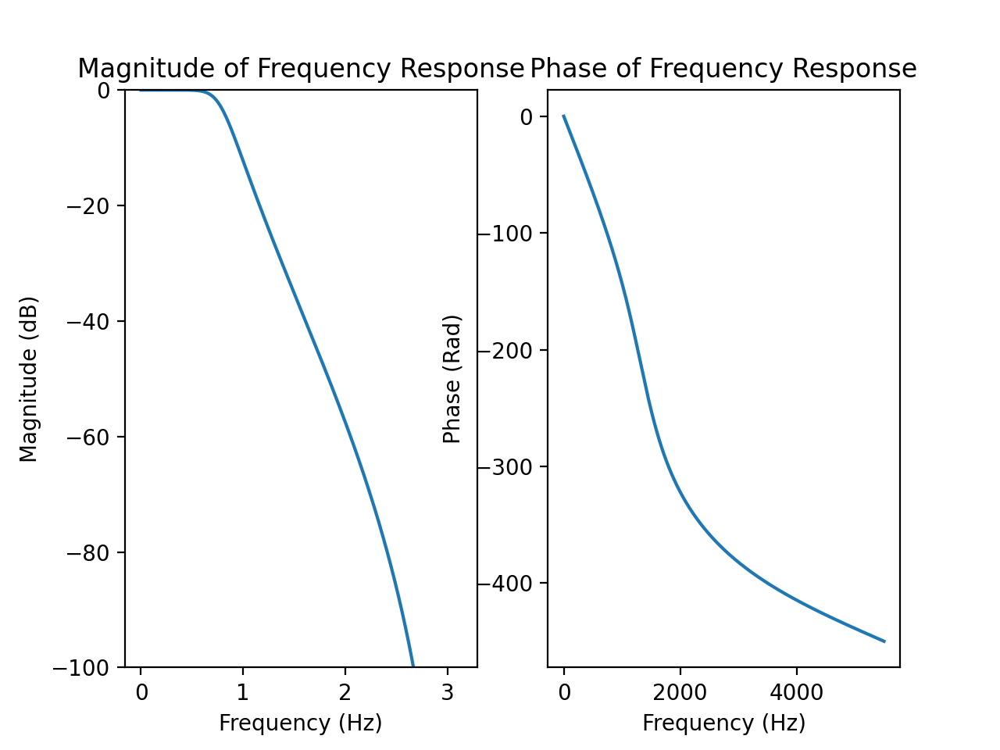

<IPython.core.display.Javascript object>


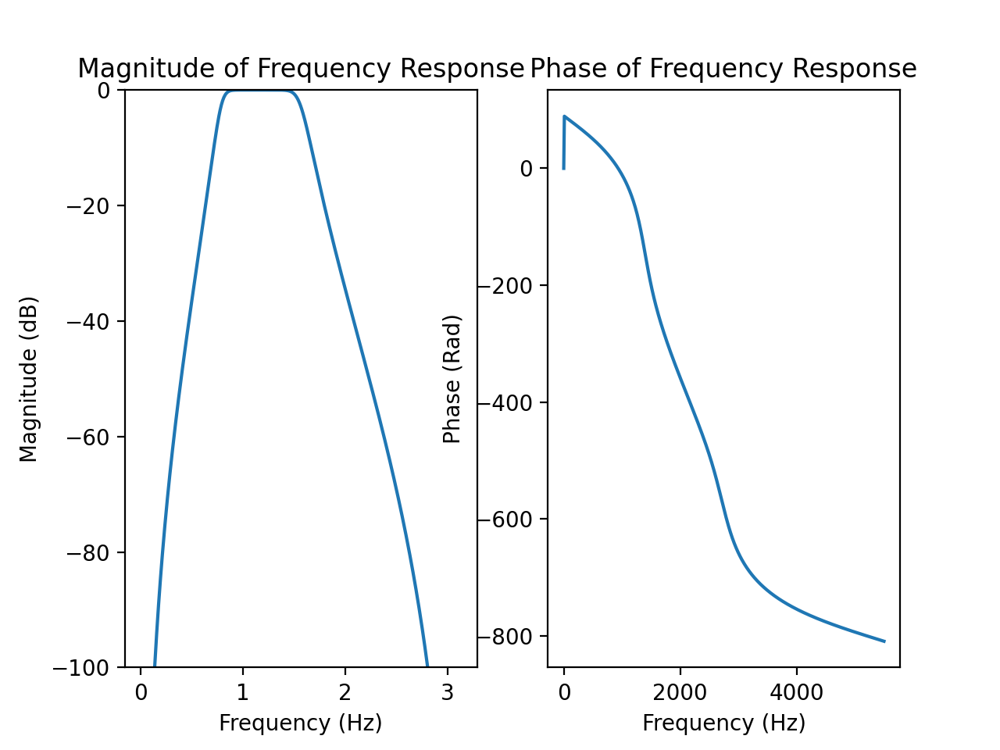

/var/folders/m3/0b8q92sn4bsgcqxnx_rn52900000gn/T/ipykernel_78693/1061126452.py:45: RuntimeWarning: divide by zero encountered in log10
  ax1.plot(w, 20 * np.log10(np.abs(hf)))


<IPython.core.display.Javascript object>


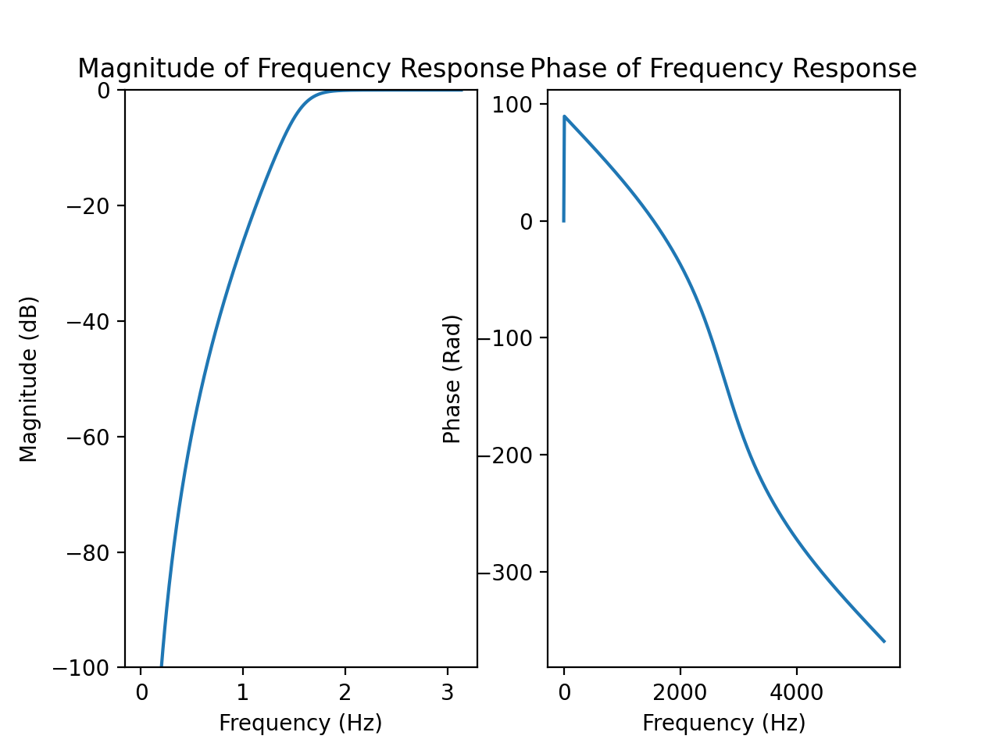

<IPython.core.display.Javascript object>


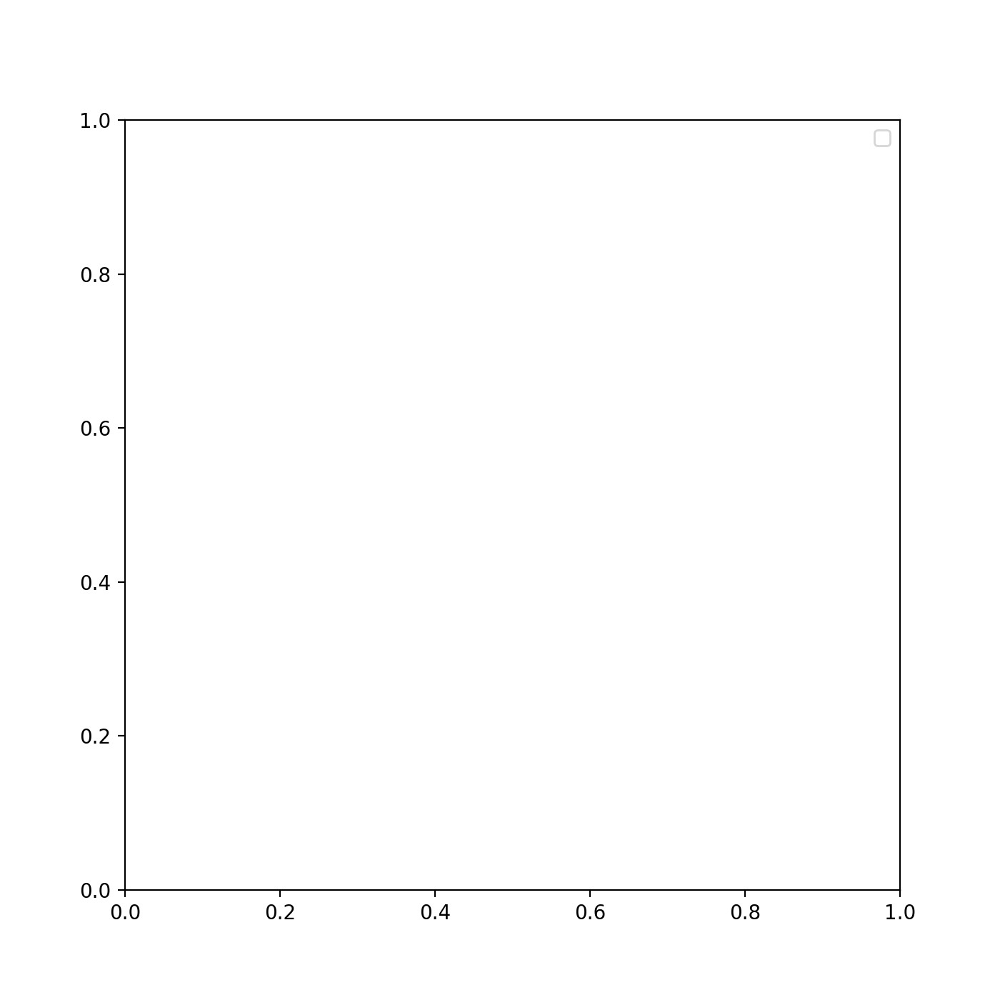

<IPython.core.display.Javascript object>


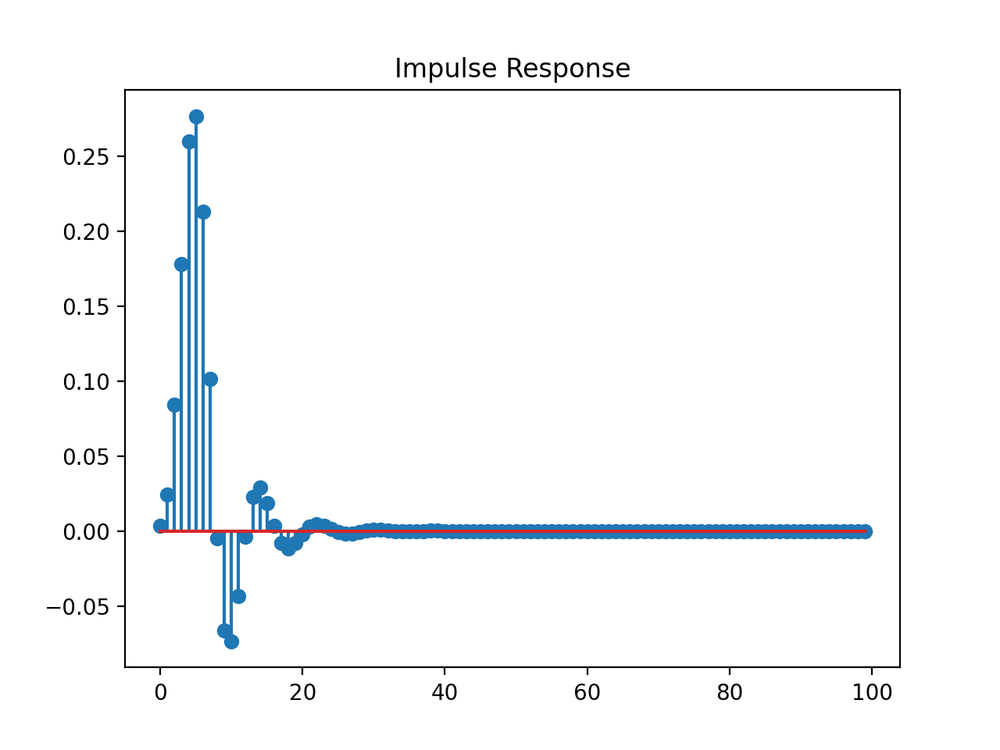

<IPython.core.display.Javascript object>


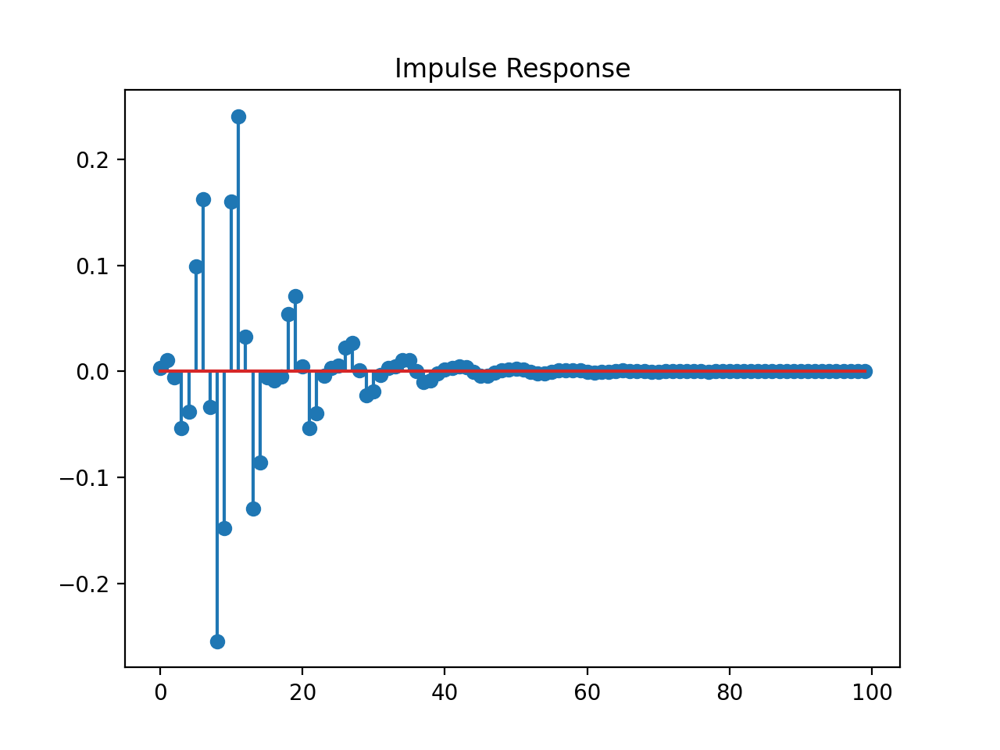

<IPython.core.display.Javascript object>


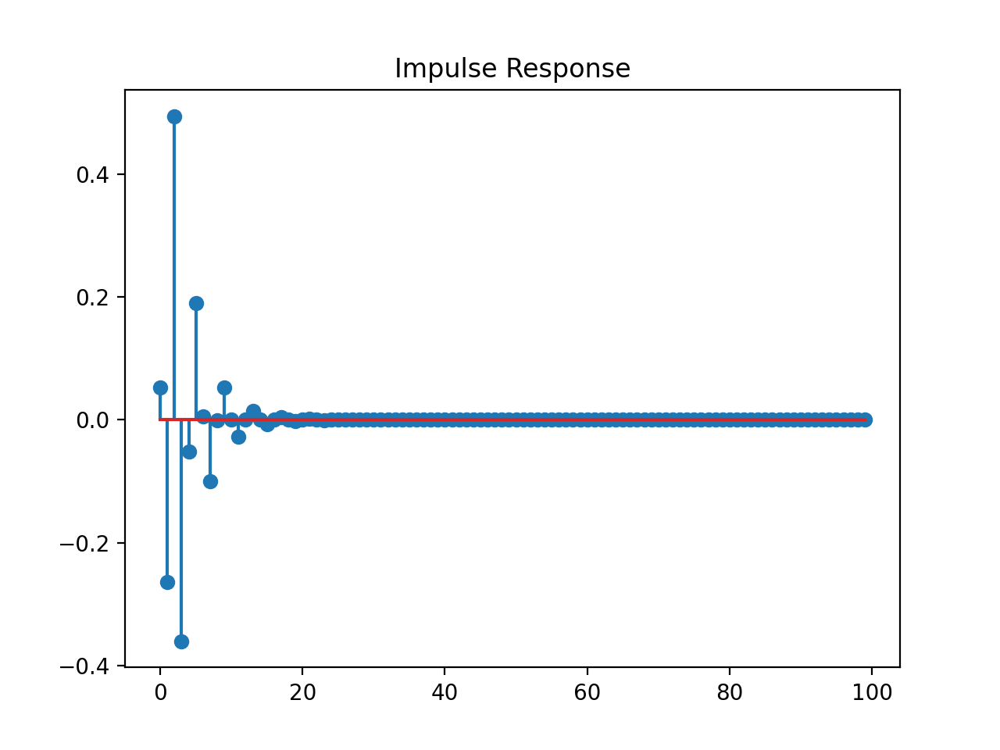

[[-16204 -12006]
 [-16107 -10627]
 [-14893 -11262]
 ...
 [  1797  11241]
 [  4157  11366]
 [  6009  11055]]


<IPython.core.display.Javascript object>


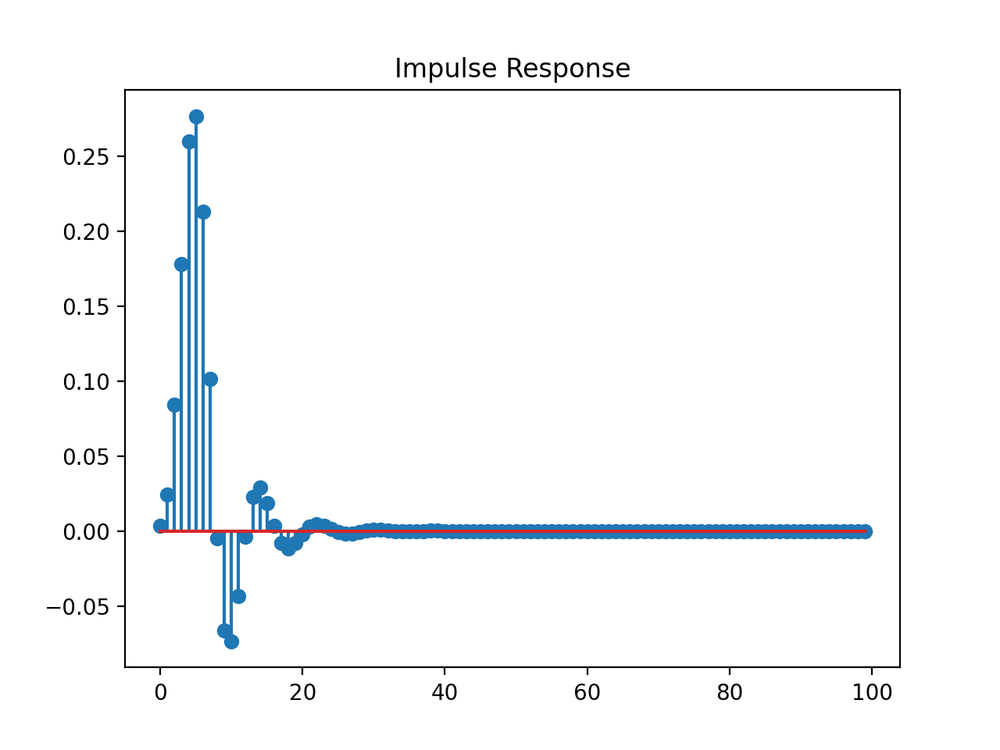

<IPython.core.display.Javascript object>


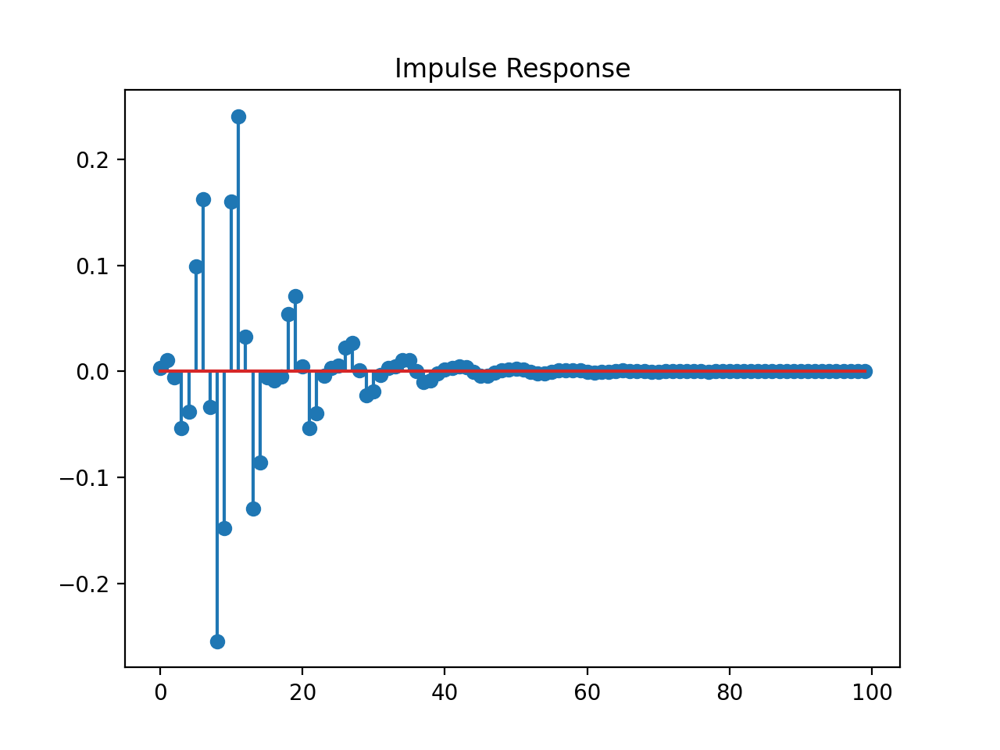

<IPython.core.display.Javascript object>


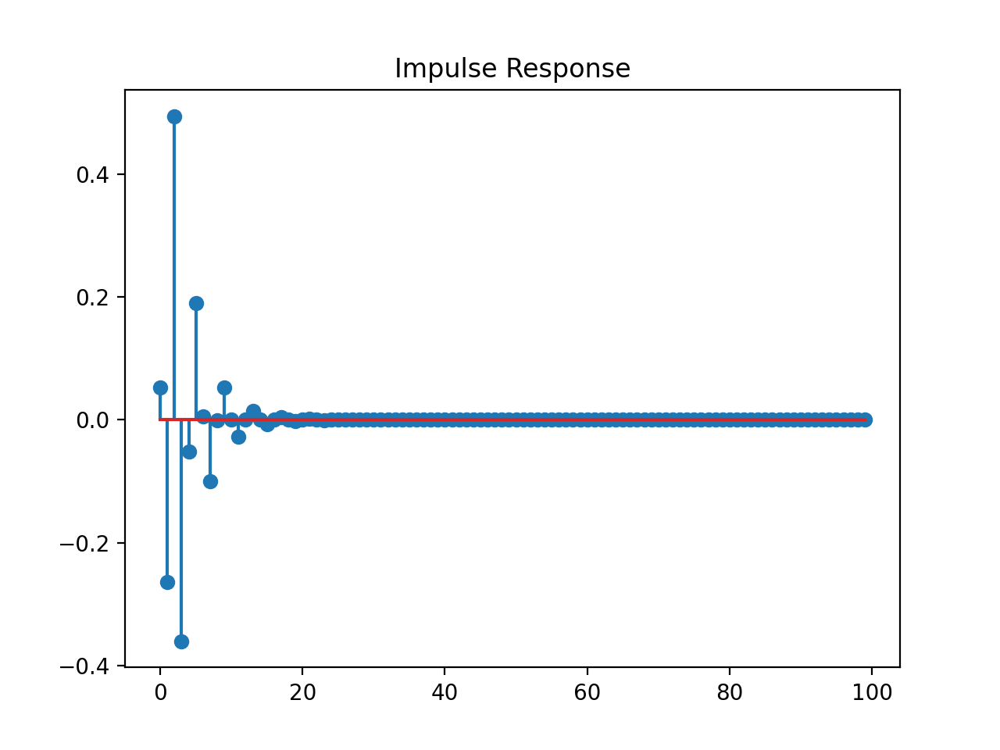

[[-16204 -12006]
 [-16107 -10627]
 [-14893 -11262]
 ...
 [  1797  11241]
 [  4157  11366]
 [  6009  11055]]


<IPython.core.display.Javascript object>


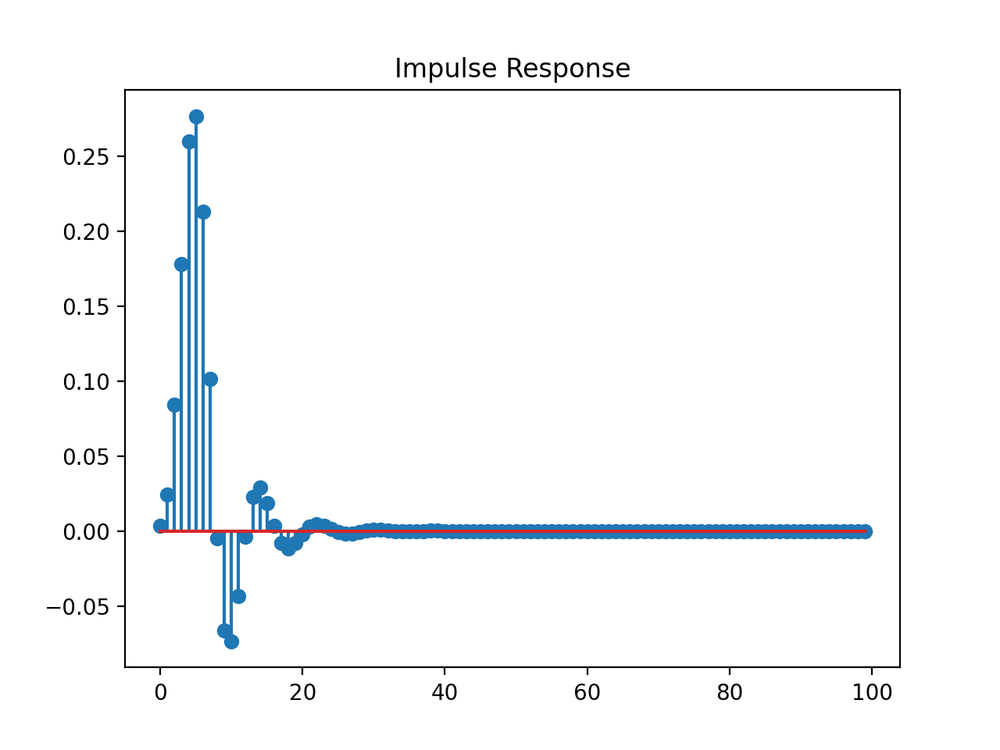

<IPython.core.display.Javascript object>


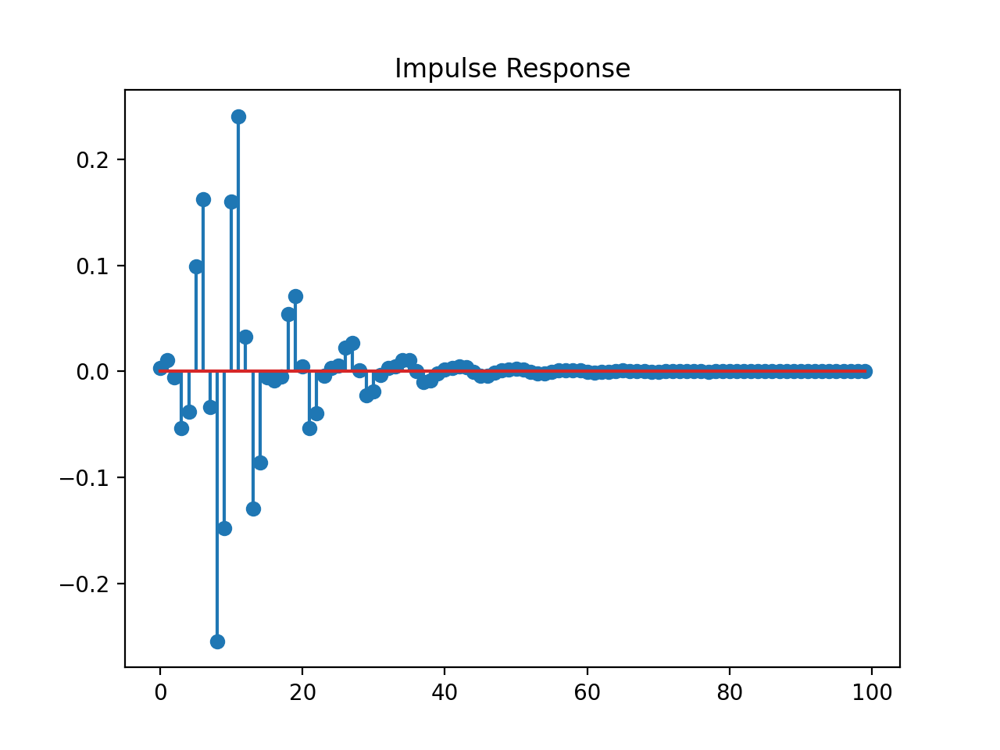

<IPython.core.display.Javascript object>


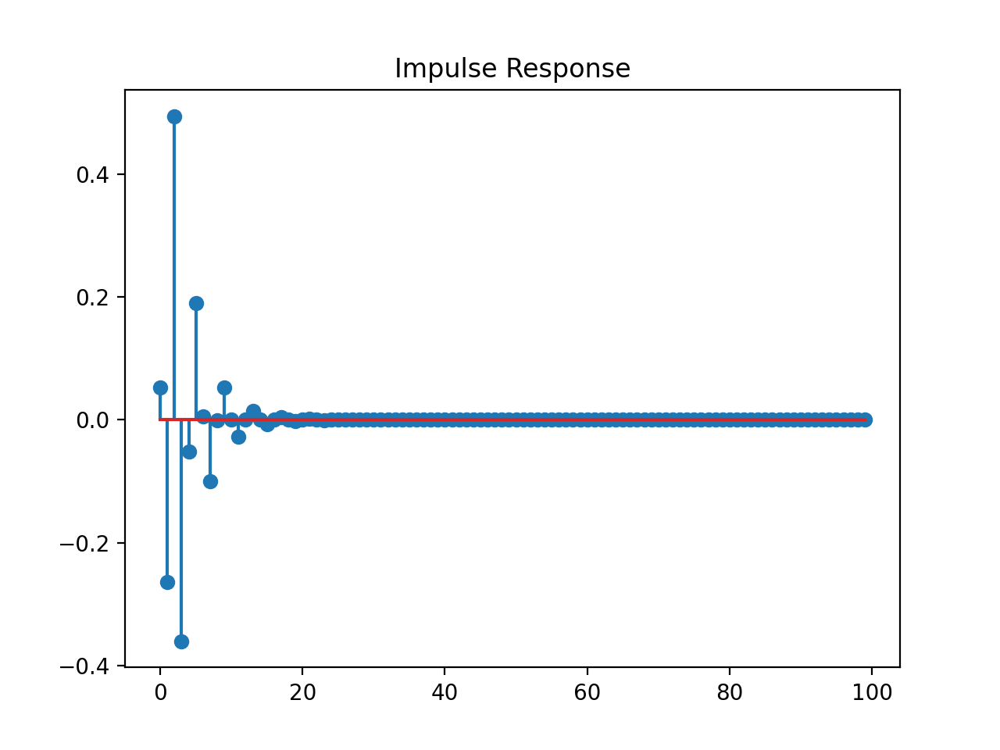

[[-16204 -12006]
 [-16107 -10627]
 [-14893 -11262]
 ...
 [  1797  11241]
 [  4157  11366]
 [  6009  11055]]


In [116]:
# Assignment 4 - Comparing frequency content of a signal
# function returns normalized cutoff frequency.
def c_norm(freq, sr):
    nyquist = sr / 2 
    return freq / nyquist

def c_norm_pi(freq):
    return freq / np.pi

    
# Part A
order3 = 5
sr = 11025

b1, a1 = sig.butter(order3, c_norm_pi(np.pi / 4), 'lowpass')
b2, a2 = sig.butter(order3, (c_norm_pi(np.pi / 4), c_norm_pi(np.pi / 2)), 'bandpass')
b3, a3 = sig.butter(order3, c_norm_pi(np.pi / 2), 'highpass')

plot1  = plot_mag_freq_response(b1, a1, 0, sr)
plot2 = plot_mag_freq_response(b2, a2, 0, sr)
plot3 = plot_mag_freq_response(b3, a3, 0, sr)

fig = plt.figure(11, figsize = (7, 7))
plt.show(plot1[0])
plt.show(plot2[0])
plt.show(plot3[0])
plt.legend(['low', 'band', 'high'])


# Part B

def audio_equalizer(audio, G1, G2, G3):
    b1, a1 = sig.butter(order3, c_norm_pi(np.pi / 4), 'lowpass')
    b2, a2 = sig.butter(order3, (c_norm_pi(np.pi / 4), c_norm_pi(np.pi / 2)), 'bandpass')
    b3, a3 = sig.butter(order3, c_norm_pi(np.pi / 2), 'highpass')    
    filt_imp1p, filt_imp1 = impulse_response(b1, a1, 100)
    filt_imp2p, filt_imp2 = impulse_response(b2, a2, 100)
    filt_imp3p, filt_imp3 = impulse_response(b3, a3, 100)
    print(audio)
    new_audio = [tup[0] for tup in audio]
    # 10 log (P2/P1) dB = G dB
    # log (realG1 / 1) = 10 G
    # realG1 = 10 ^ (10 G)
    
    realG1 = 10**(10 * G1)
    realG2 = 10**(10 * G2)
    realG3 = 10**(10 * G3)
    
    musicL = np.convolve(filt_imp1, new_audio,'full')
    musicM = np.convolve(filt_imp2, new_audio,'full')
    musicH = np.convolve(filt_imp3, new_audio, 'full')
    # Note that G1, G2, G3 are in dB
    equal_audio = np.add(musicL * realG1, musicM * realG2)
    equal_audio = np.add(equal_audio, musicH * realG3)
    # Return your output here
    return equal_audio


# Part C

music_sr, music_orig = sp.read("music.wav")

equal_music = audio_equalizer(music_orig, 0, 0, 0)
bass = audio_equalizer(music_orig, 0, -40, -40)
treble = audio_equalizer(music_orig, -40, 0, -40)

sp.write('musicG1.wav', music_sr, equal_music.astype('int16'))
sp.write('bass.wav', music_sr, bass.astype('int16'))
sp.write('treble.wav', music_sr, treble.astype('int16'))

IPython.display.display(IPython.display.Audio("music.wav"))
IPython.display.display(IPython.display.Audio("musicG1.wav"))
IPython.display.display(IPython.display.Audio("bass.wav"))
IPython.display.display(IPython.display.Audio("treble.wav"))


# Part D is completed above. ^

###  Discussion

Discuss what types of gains lead to an audible difference. Are there any constraints you need to put on the gains?